# Chicago Rideshare EDA

## Summary Stats Overview 

In [2]:
# Import packages
import pandas as pd
from pandas.plotting import scatter_matrix
import pandas_profiling
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

In [3]:
# Import data
data = pd.read_csv("project_data.csv")

In [3]:
# Check the head
data.head()

,Unnamed: 0,ride_type_id,duration_seconds,miles,fare,tip,tolls,extra_charges,trip_total,payment_type,...,speed_dropoff_end,speed_category_dropoff_end,bus_count_dropoff_end,gps_pings_dropoff_end,region_pickup,lat_centroid_pickup,long_centroid_pickup,region_dropoff,lat_centroid_dropoff,long_centroid_dropoff
0,0,1,266.0,0.78,5.5,0.0,0.0,0.0,5.5,Cash,...,19.090000,medium,293.0,4960.0,Near North,-87.635144,41.900130,Near North,-87.635144,41.900130
1,1,1,584.0,1.19,7.5,1.0,0.0,1.0,10.0,Credit Card,...,23.035000,regular,180.0,1947.0,Chicago Loop,-87.635144,41.877494,Downtown Lakefront,-87.609229,41.888765
2,2,1,2510.0,18.10,45.5,0.0,0.0,4.0,49.5,Cash,...,21.080000,regular,211.0,3856.0,Far North West,-87.796833,41.989884,Chicago Loop,-87.635144,41.877494
3,3,1,780.0,0.00,8.5,0.0,0.0,0.0,8.5,Cash,...,18.780000,medium,310.0,3006.0,Near North,-87.635144,41.900130,Near North,-87.635144,41.900130
4,4,1,585.0,1.87,8.5,0.0,0.0,0.0,8.5,Cash,...,14.886667,medium,598.0,8986.0,Chicago Loop,-87.635144,41.877494,Near North,-87.635144,41.900130


In [4]:
# Check data type
data.dtypes

Unnamed: 0                       int64
ride_type_id                     int64
duration_seconds               float64
miles                          float64
fare                           float64
tip                            float64
tolls                          float64
extra_charges                  float64
trip_total                     float64
payment_type                    object
start_time                      object
start_date                      object
start_month                      int64
start_year                       int64
start_weekday                   object
end_time                        object
end_date                        object
end_month                        int64
end_year                         int64
end_weekday                     object
speed_pickup_start             float64
speed_category_pickup_start     object
bus_count_pickup_start         float64
gps_pings_pickup_start         float64
speed_dropoff_end              float64
speed_category_dropoff_en

In [4]:
# Data Transformation: 
# Create variable "tip_flag" to indicate existance of tip in that ride
data["tip_flag"] = data["tip"].apply(lambda x: 1 if x > 0 else 0)

# Change "ride_type_id" to "ride_type"
data["ride_type"] = data["ride_type_id"].apply(lambda x: "Taxi" if x == 1 else "Rideshare")

In [7]:
# Convert months and weekdays to categories
data["start_month"] = data["start_month"].astype('category')
data["start_weekday"] = data["start_weekday"].astype('category')

In [8]:
# Drop less useful columns
data.drop(["ride_type_id"], axis = 1, inplace = True)
data.drop(["start_year","end_time", "end_date", "end_month", "end_year", "end_weekday"], axis = 1, inplace = True)
data.drop(["lat_centroid_pickup", "long_centroid_pickup", "lat_centroid_dropoff", "long_centroid_dropoff"], 
          axis = 1, inplace = True)

In [8]:
# Recheck data type
data.dtypes

Unnamed: 0                        int64
duration_seconds                float64
miles                           float64
fare                            float64
tip                             float64
tolls                           float64
extra_charges                   float64
trip_total                      float64
payment_type                     object
start_time                       object
start_date                       object
start_month                    category
start_weekday                  category
speed_pickup_start              float64
speed_category_pickup_start      object
bus_count_pickup_start          float64
gps_pings_pickup_start          float64
speed_dropoff_end               float64
speed_category_dropoff_end       object
bus_count_dropoff_end           float64
gps_pings_dropoff_end           float64
region_pickup                    object
region_dropoff                   object
tip_flag                          int64
ride_type                        object


In [9]:
# Descriptive statistics
data.describe()

,Unnamed: 0,duration_seconds,miles,fare,tip,tolls,extra_charges,trip_total,speed_pickup_start,bus_count_pickup_start,gps_pings_pickup_start,speed_dropoff_end,bus_count_dropoff_end,gps_pings_dropoff_end,tip_flag
count,5.536744e+06,5.536744e+06,5.536744e+06,5.536744e+06,5.536744e+06,5.536744e+06,5.536744e+06,5.536744e+06,5.536704e+06,5.536704e+06,5.536704e+06,5.536622e+06,5.536622e+06,5.536622e+06,5.536744e+06
mean,2.768372e+06,9.721956e+02,4.687717e+00,1.089915e+01,6.969270e-01,1.352022e-04,2.582114e+00,1.419611e+01,2.145925e+01,3.110617e+02,5.192778e+03,2.142015e+01,3.112724e+02,5.203180e+03,2.209972e-01
std,1.598320e+06,8.294646e+02,4.929221e+00,2.045545e+01,1.762117e+00,7.785165e-02,6.117529e+00,2.210587e+01,4.772274e+00,2.397324e+02,4.217190e+03,4.906544e+00,2.461353e+02,4.318657e+03,4.149186e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.384186e+06,4.840000e+02,1.490000e+00,5.000000e+00,0.000000e+00,0.000000e+00,2.550000e+00,7.550000e+00,1.886333e+01,1.490000e+02,2.315000e+03,1.881800e+01,1.460000e+02,2.282000e+03,0.000000e+00
50%,2.768372e+06,7.800000e+02,2.900000e+00,7.500000e+00,0.000000e+00,0.000000e+00,2.550000e+00,1.005000e+01,2.164750e+01,2.570000e+02,4.254000e+03,2.159333e+01,2.550000e+02,4.200000e+03,0.000000e+00
75%,4.152557e+06,1.236000e+03,5.900000e+00,1.250000e+01,0.000000e+00,0.000000e+00,2.550000e+00,1.505000e+01,2.454500e+01,4.140000e+02,6.880000e+03,2.454500e+01,4.140000e+02,6.833000e+03,0.000000e+00
max,5.536743e+06,8.640000e+04,9.810000e+02,9.005500e+03,2.000000e+02,7.500000e+01,6.668640e+03,9.005500e+03,1.404260e+02,1.504000e+03,2.837700e+04,1.290367e+02,1.504000e+03,2.837700e+04,1.000000e+00


In [9]:
# Classify variables
num_vars = ["duration_seconds", "miles", "fare", "tip", "tolls", "extra_charges", "trip_total", 
            "speed_pickup_start", "bus_count_pickup_start", "gps_pings_pickup_start", "speed_dropoff_end", 
           "bus_count_dropoff_end", "gps_pings_dropoff_end"]

cat_vars = ["payment_type", "speed_category_pickup_start", "speed_category_dropoff_end", "region_pickup", 
           "region_dropoff", "tip_flag", "ride_type","start_month", "start_weekday"]

time_vars = ["start_time", "start_date"]

data = data[cat_vars + num_vars + time_vars]
data.shape

(5536744, 24)

In [11]:
# Profiling with pandas
pandas_profiling.ProfileReport(data)

In [ ]:
pandas_profiling.ProfileReport(data).to_file("RideshareEDA.html")

## Numerical Variable EDA

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x13cc2f940>,
      dtype=object)

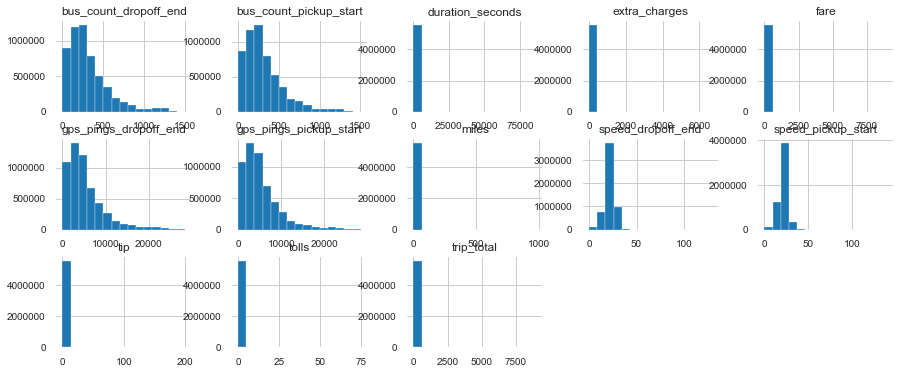

In [10]:
# Distribution overview
data[num_vars].hist(bins=15, figsize=(15, 6), layout=(3, 5))

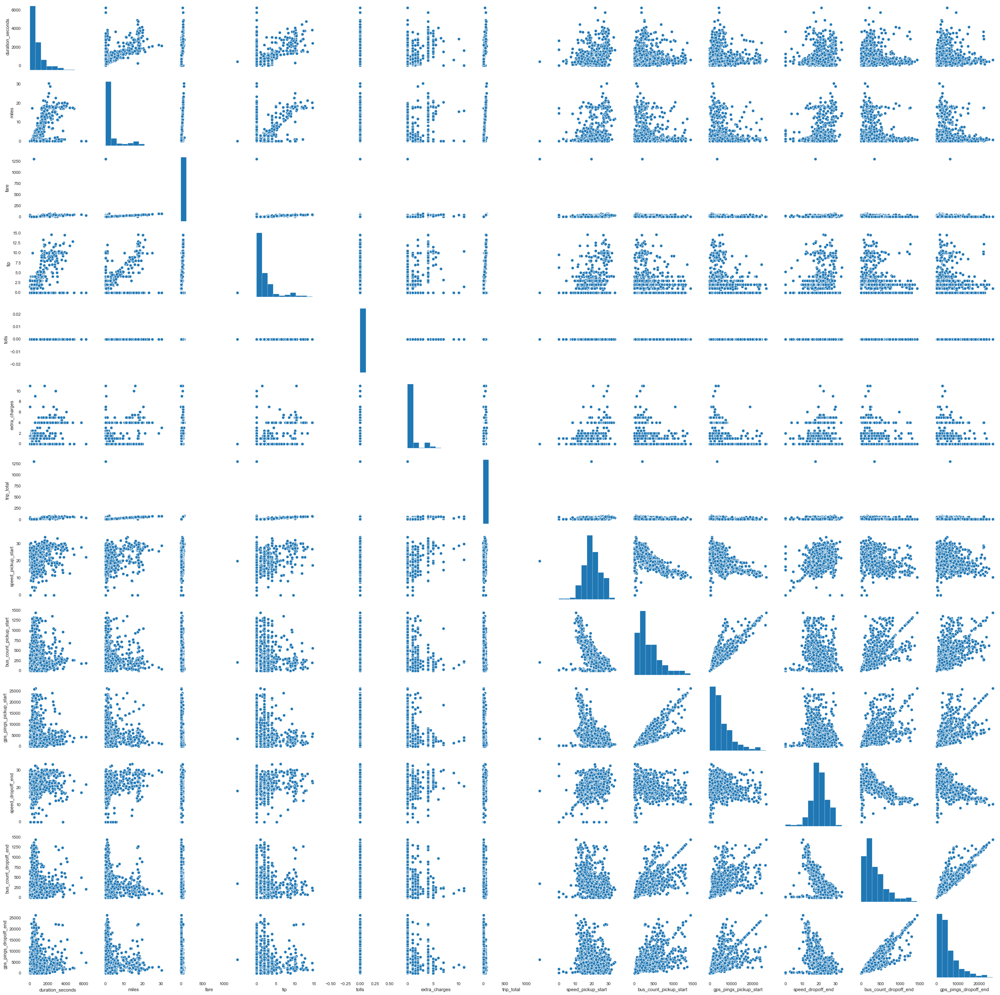

In [11]:
# Correlation matrix overview
sns.pairplot(data[num_vars].iloc[0:1000,])
plt.show()

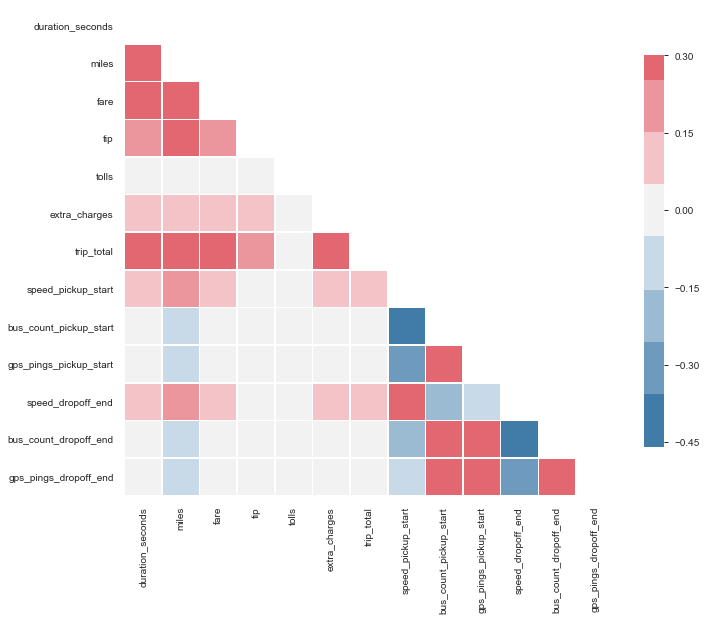

In [12]:
# Heat map
corr =  data[num_vars].corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, n=9)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .8})
plt.show()

**Insights**
High negative correlation exists between bus count and the bus speed (both pickup and dropoff).
Tip has postive correlation with duration, miles, fare, extra charges, trip total. 
Weak/zero correlation exists between tip and speed and traffic.

## Categorical Variable EDA

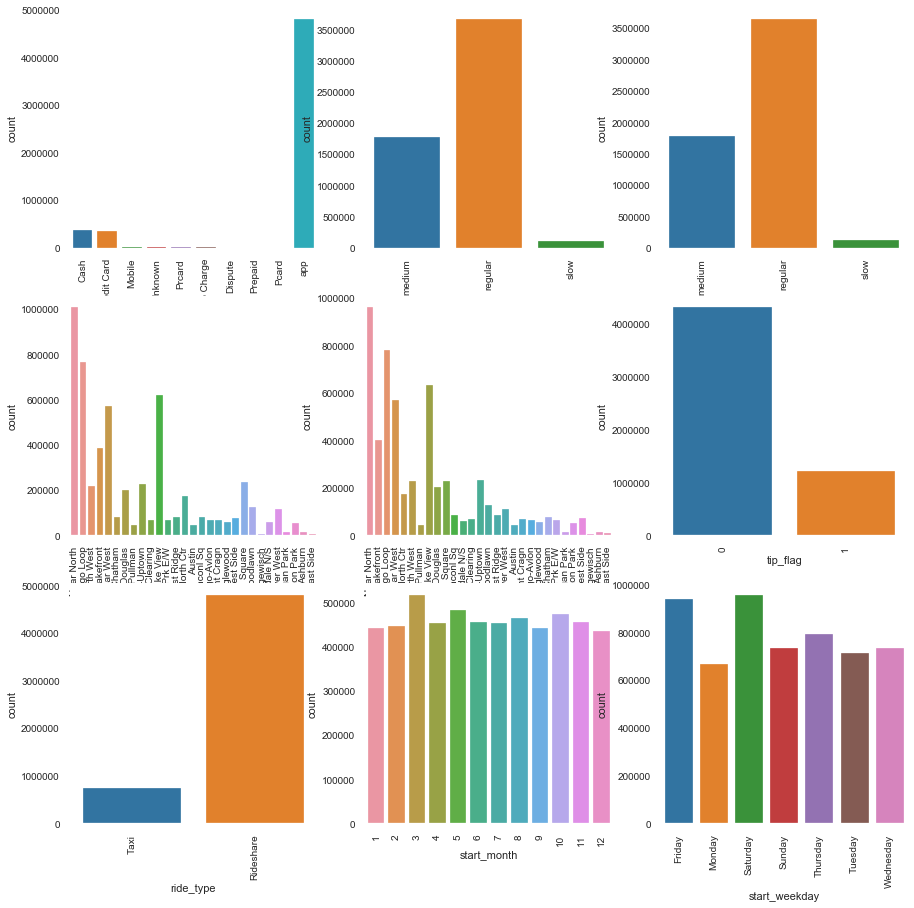

In [13]:
# Count distribution overview
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for variable, subplot in zip(cat_vars, ax.flatten()):
    sns.countplot(data[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)

In [14]:
# Instantiate labelencoder object and apply on categorical columns
le = LabelEncoder()
cat_data = data[cat_vars]
original = cat_data
mask = cat_data.isnull()

data_encoded = cat_data.astype(str).apply(le.fit_transform)
data_encoded.where(~mask,original)

,payment_type,speed_category_pickup_start,speed_category_dropoff_end,region_pickup,region_dropoff,tip_flag,ride_type,start_month,start_weekday
0,0,0,0,18,18,0,1,7,0
1,1,0,2,5,6,1,1,0,6
2,0,2,2,9,5,0,1,4,3
3,0,0,0,18,18,0,1,9,5
4,0,0,0,5,18,0,1,4,4
...,...,...,...,...,...,...,...,...,...
5536739,9,2,2,16,18,0,0,5,3
5536740,9,2,0,10,18,0,0,11,6
5536741,9,0,0,28,5,0,0,0,4
5536742,9,0,2,18,9,0,0,7,0


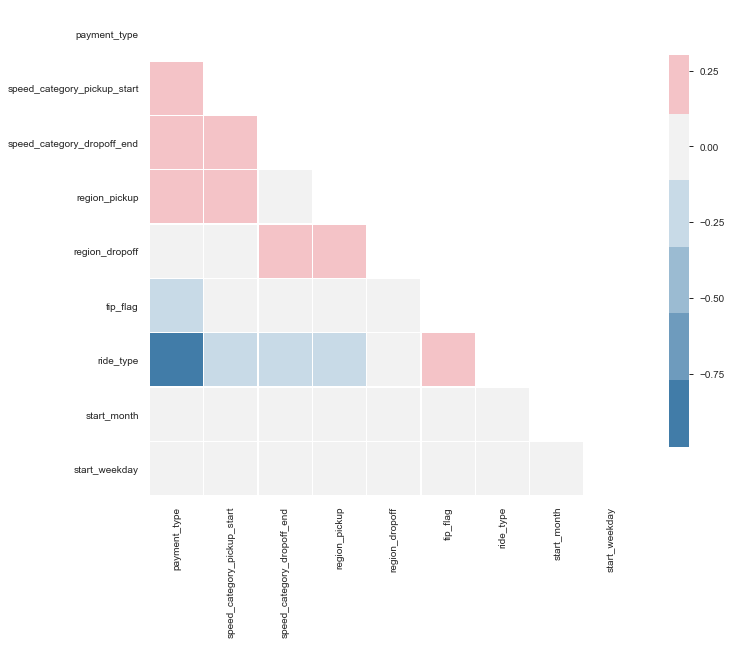

In [15]:
# Correlation matrix overview
corr =  data_encoded.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(240, 10, n=9)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .8})
plt.show()

### Count and % of Categorical Variables

In [16]:
# Count categorical variables
counts = data[cat_vars]["region_pickup"].value_counts()
percent100 = data[cat_vars]["region_pickup"].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
region_pickup =pd.DataFrame({'counts': counts, 'Percent': percent100})
region_pickup

,counts,Percent
Near North,1008484,18.2%
Chicago Loop,763926,13.8%
Lincoln Park-Lake View,621311,11.2%
West Town-Near West,569505,10.3%
Downtown Lakefront,386277,7.0%
Hermosa-Logan Square,233904,4.2%
Edge Water-Uptown,227793,4.1%
Far North West,216218,3.9%
Near South-Douglas,199740,3.6%
Irving Park-Avondale-North Ctr,171857,3.1%


In [17]:
counts = data[cat_vars]["region_dropoff"].value_counts()
percent100 = data[cat_vars]["region_dropoff"].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
region_dropoff =pd.DataFrame({'counts': counts, 'Percent': percent100})
region_dropoff

,counts,Percent
Near North,960965,17.4%
Chicago Loop,777755,14.0%
Lincoln Park-Lake View,630967,11.4%
West Town-Near West,570432,10.3%
Downtown Lakefront,401110,7.2%
Edge Water-Uptown,233036,4.2%
Hermosa-Logan Square,230175,4.2%
Far North West,230015,4.2%
Near South-Douglas,204619,3.7%
Irving Park-Avondale-North Ctr,173908,3.1%


In [18]:
counts = data[cat_vars]["payment_type"].value_counts()
percent100 = data[cat_vars]["payment_type"].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
payment_type=pd.DataFrame({'counts': counts, 'Percent': percent100})
payment_type

,counts,Percent
app,4803318,86.8%
Cash,358758,6.5%
Credit Card,350370,6.3%
Mobile,10810,0.2%
Prcard,6819,0.1%
Unknown,5077,0.1%
No Charge,1283,0.0%
Dispute,256,0.0%
Prepaid,28,0.0%
Pcard,25,0.0%


In [19]:
counts = data["start_month"].value_counts()
percent100 = data["start_month"].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
start_month=pd.DataFrame({'counts': counts, 'Percent': percent100})
start_month

,counts,Percent
3,518828,9.4%
5,484336,8.7%
10,474236,8.6%
8,466592,8.4%
11,456909,8.3%
6,456762,8.2%
7,454624,8.2%
4,454439,8.2%
2,447499,8.1%
1,443244,8.0%


In [20]:
counts = data["start_weekday"].value_counts()
percent100 = data["start_weekday"].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
start_day=pd.DataFrame({'counts': counts, 'Percent': percent100})
start_day

,counts,Percent
Saturday,957375,17.3%
Friday,938541,17.0%
Thursday,793735,14.3%
Sunday,733638,13.3%
Wednesday,733302,13.2%
Tuesday,711568,12.9%
Monday,668585,12.1%


## Relationship Analysis Among Categorical Data

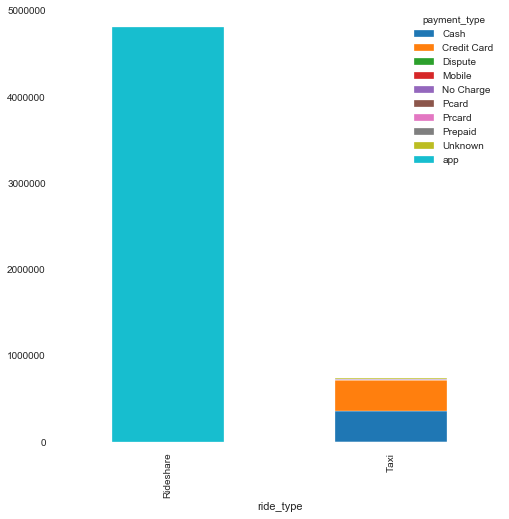

In [21]:
# Payment type by ride type
payment_vs_ride = pd.crosstab(index=data["ride_type"], columns=data["payment_type"]) 
payment_vs_ride.plot(kind="bar", figsize=(8,8),stacked=True)

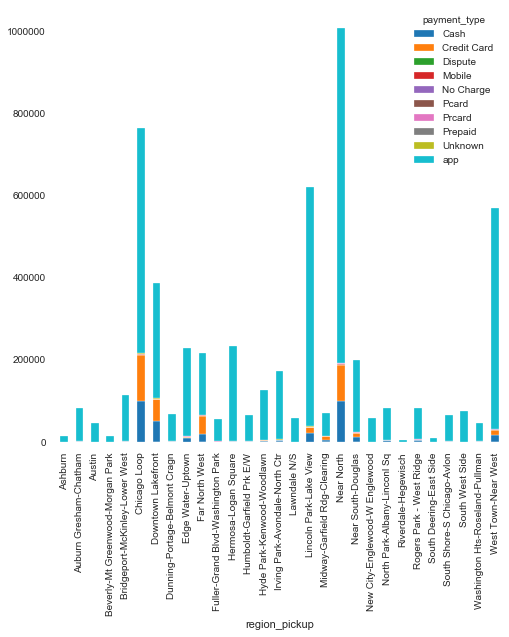

In [22]:
# Payment type by pickup region
payment_vs_pickupRegion = pd.crosstab(index=data["region_pickup"], columns=data["payment_type"]) 
payment_vs_pickupRegion.plot(kind="bar", figsize=(8,8),stacked=True)

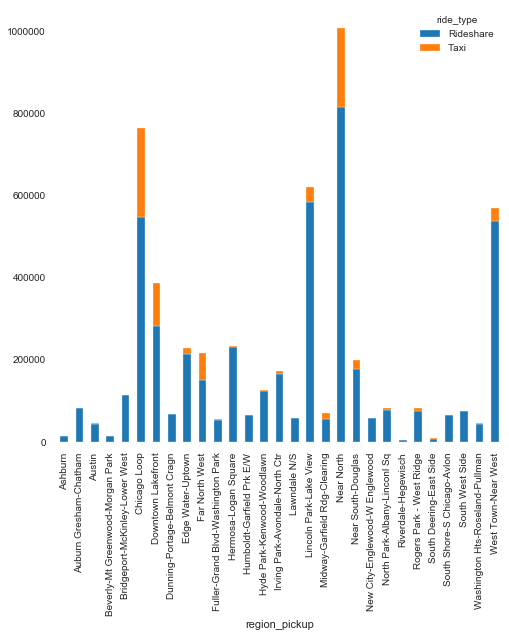

In [23]:
# Ride type by pickup region
ride_vs_pickupRegion = pd.crosstab(index=data["region_pickup"], columns=data["ride_type"])
ride_vs_pickupRegion.plot(kind="bar", figsize=(8,8),stacked=True)

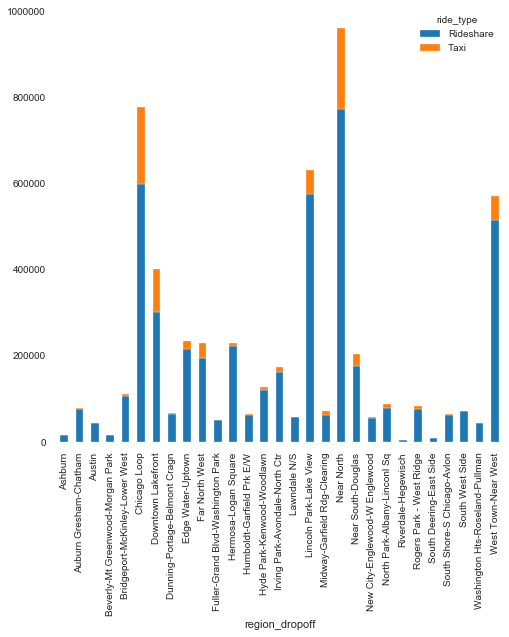

In [24]:
# Ride type by dropoff region
ride_vs_dropoffRegion = pd.crosstab(index=data["region_dropoff"], columns=data["ride_type"])
ride_vs_dropoffRegion.plot(kind="bar", figsize=(8,8),stacked=True)

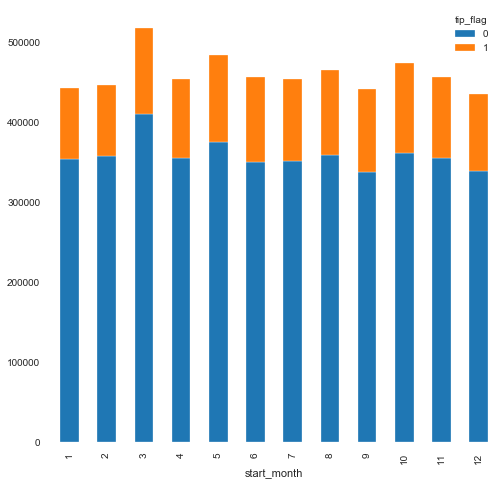

In [25]:
# Month by tip
month_vs_tip = pd.crosstab(index=data["start_month"], columns=data["tip_flag"])
month_vs_tip.plot(kind="bar", figsize=(8,8),stacked=True)

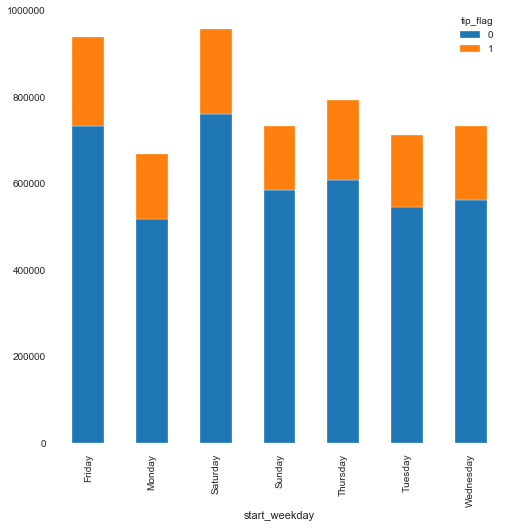

In [26]:
# Weekday by tip
day_vs_tip = pd.crosstab(index=data["start_weekday"], columns=data["tip_flag"])
day_vs_tip.plot(kind="bar", figsize=(8,8),stacked=True)

## Relationship Analysis Among Numerical Data and Categorical Data

#### Boxplot of categorical variable with different numerical variables

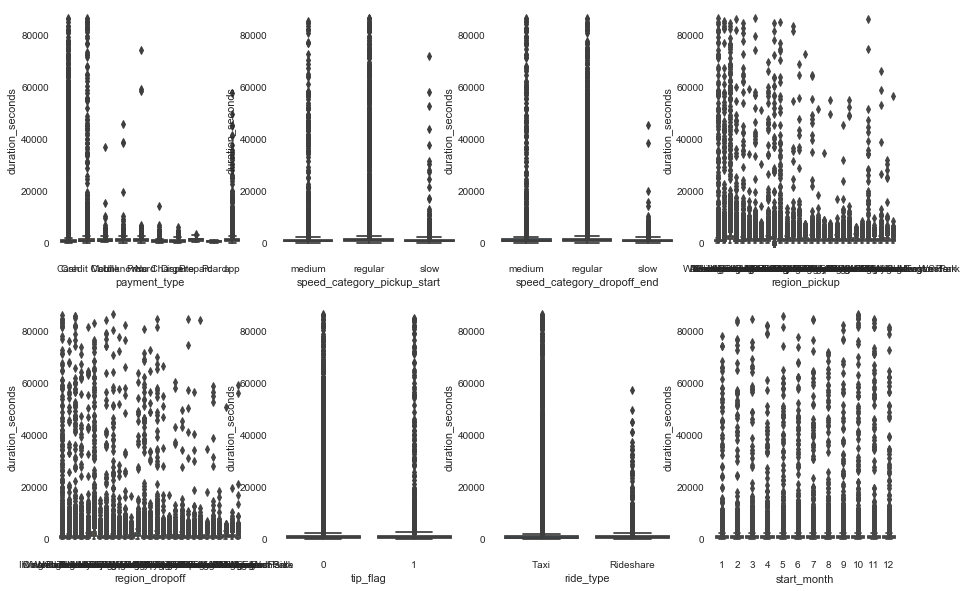

In [28]:
# cat_vars vs. duration
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
for var, subplot in zip(cat_vars, ax.flatten()):
    sns.boxplot(x=var, y='duration_seconds', data=data, ax=subplot)

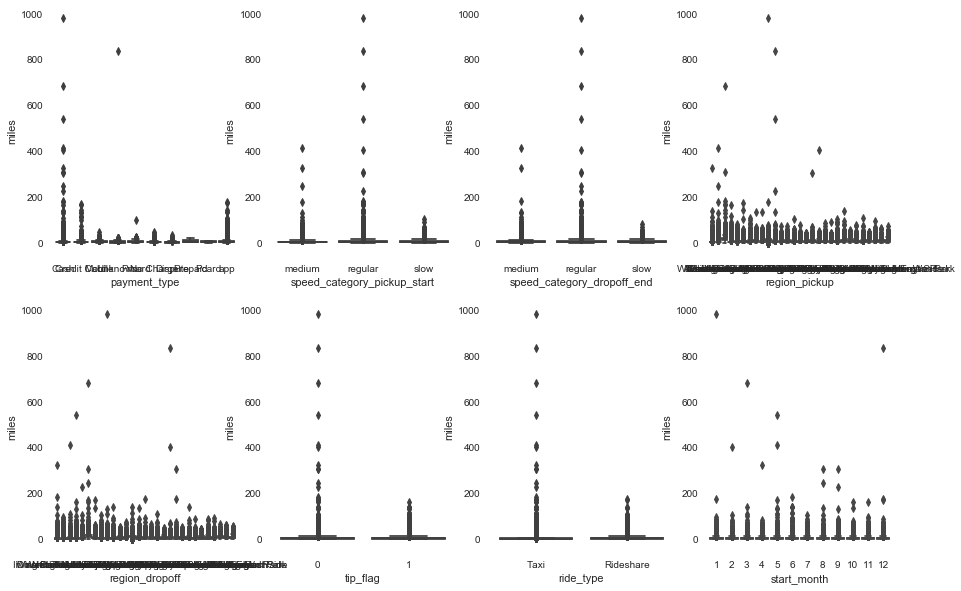

In [29]:
# cat_vars vs. miles
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
for var, subplot in zip(cat_vars, ax.flatten()):
    sns.boxplot(x=var, y='miles', data=data, ax=subplot)

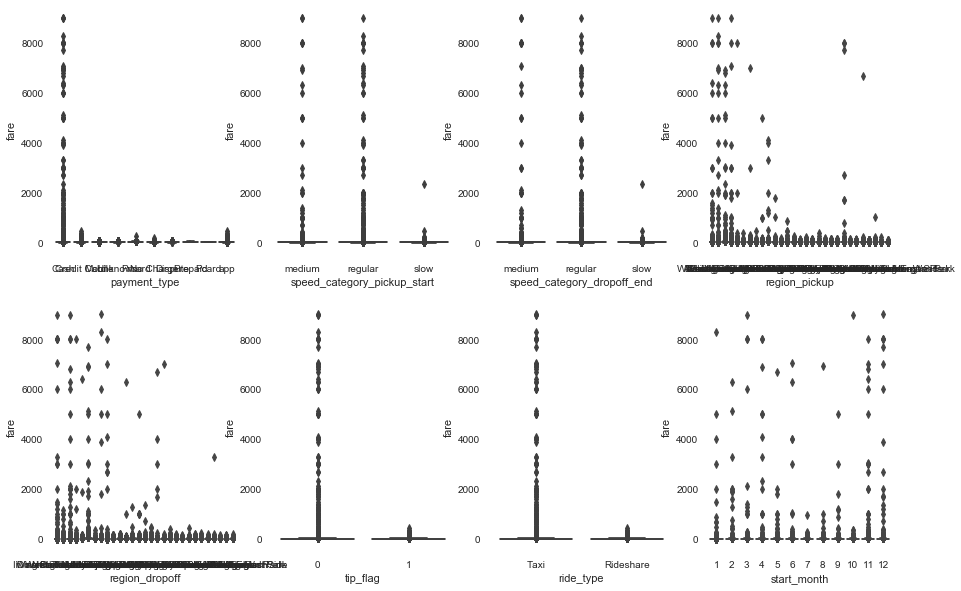

In [33]:
# cat_vars vs. fare
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
for var, subplot in zip(cat_vars, ax.flatten()):
    sns.boxplot(x=var, y='fare', data=data, ax=subplot)

Reference:
https://towardsdatascience.com/how-to-perform-exploratory-data-analysis-with-seaborn-97e3413e841d
https://blog.growingdata.com.au/a-guided-introduction-to-exploratory-data-analysis-eda-using-python/